# SWOT Hydrology Dataset Exploration in the Cloud

## Accessing and Visualizing SWOT Datasets

### Requirement:
This tutorial can only be run in an **AWS cloud instance running in us-west-2**: NASA Earthdata Cloud data in S3 can be directly accessed via `earthaccess` python library; this access is limited to requests made within the US West (Oregon) (code: `us-west-2`) AWS region.

### Learning Objectives:
- Access SWOT HR data prodcuts (archived in NASA Earthdata Cloud) within the AWS cloud, without downloading to local machine
- Visualize accessed data for a quick check

#### SWOT Level 2 KaRIn High Rate Version 1.1 (where available) Datasets:

1. **River Vector Shapefile** - SWOT_L2_HR_RIVERSP_1.1

2. **Lake Vector Shapefile** - SWOT_L2_HR_LAKESP_1.1

3. **Water Mask Pixel Cloud NetCDF** - SWOT_L2_HR_PIXC_1.1

4. **Water Mask Pixel Cloud Vector Attribute NetCDF** - SWOT_L2_HR_PIXCVec_1.1

5. **Raster NetCDF** - SWOT_L2_HR_Raster_1.1

6. **Single Look Complex Data product** - SWOT_L1B_HR_SLC_1.1

_Notebook Author: Cassie Nickles, NASA PO.DAAC (Aug 2023) || Other Contributors: Zoe Walschots (PO.DAAC Summer Intern 2023), Catalina Taglialatela (NASA PO.DAAC), Luis Lopez (NASA NSIDC DAAC)_

_Last updated: 4 Dec 2023_
  

### Libraries Needed

In [1]:
import glob
import os
import requests
import s3fs
import fiona
import netCDF4 as nc
import h5netcdf
import xarray as xr
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import hvplot.xarray
import earthaccess
from earthaccess import Auth, DataCollections, DataGranules, Store

### Earthdata Login

An Earthdata Login account is required to access data, as well as discover restricted data, from the NASA Earthdata system. Thus, to access NASA data, you need Earthdata Login. If you don't already have one, please visit https://urs.earthdata.nasa.gov to register and manage your Earthdata Login account. This account is free to create and only takes a moment to set up. We use `earthaccess` to authenticate your login credentials below.

In [2]:
auth = earthaccess.login()

EARTHDATA_USERNAME and EARTHDATA_PASSWORD are not set in the current environment, try setting them or use a different strategy (netrc, interactive)
You're now authenticated with NASA Earthdata Login
Using token with expiration date: 01/07/2024
Using .netrc file for EDL


### Single File Access

#### **1. River Vector Shapefiles**

The s3 access link can be found using `earthaccess` data search. Since this collection consists of Reach and Node files, we need to extract only the granule for the Reach file. We do this by filtering for the 'Reach' title in the data link.

Alternatively, Earthdata Search [(see tutorial)](https://nasa-openscapes.github.io/2021-Cloud-Workshop-AGU/tutorials/01_Earthdata_Search.html) can be used to search in a map graphic user interface.

For additional tips on spatial searching of SWOT HR L2 data, see also [PO.DAAC Cookbook - SWOT Chapter tips section](https://podaac.github.io/tutorials/quarto_text/SWOT.html#tips-for-swot-hr-spatial-search).

#### Search for the data of interest

In [3]:
#Retrieves granule from the day we want, in this case by passing to `earthdata.search_data` function the data collection shortname, temporal bounds, and for restricted data one must specify the search count
river_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_RIVERSP_1.1', 
                                        temporal = ('2023-04-08 00:00:00', '2023-04-22 23:59:59'),
                                        granule_name = '*Reach*_013_NA*') # here we filter by Reach files (not node), pass #13 and continent code=NA

Granules found: 14


#### Set up an `s3fs` session for Direct Cloud Access
`s3fs` sessions are used for authenticated access to s3 bucket and allows for typical file-system style operations. Below we create session by passing in the data access information.

In [4]:
fs_s3 = earthaccess.get_s3fs_session(results=river_results)

#### Create Fiona session to work with zip and embedded shapefiles in the AWS Cloud
The native format for this data is a **.zip** file, and we want the **.shp** file within the .zip file, so we will create a Fiona AWS session using the credentials from setting up the s3fs session above to access the shapefiles within the zip files. If we don't do this, the alternative would be to download the data to the cloud environment (e.g. EC2 instance, user S3 bucket) and extract the .zip file there.

In [5]:
fiona_session=fiona.session.AWSSession(
        aws_access_key_id=fs_s3.storage_options["key"],
        aws_secret_access_key=fs_s3.storage_options["secret"],
        aws_session_token=fs_s3.storage_options["token"]
    )

In [6]:
# Get the link for the first zip file
river_link = earthaccess.results.DataGranule.data_links(river_results[0], access='direct')[0]

# We use the zip+ prefix so fiona knows that we are operating on a zip file
river_shp_url = f"zip+{river_link}"

with fiona.Env(session=fiona_session):
    SWOT_HR_shp1 = gpd.read_file(river_shp_url) 

#view the attribute table
SWOT_HR_shp1 

,reach_id,time,time_tai,time_str,p_lat,p_lon,river_name,wse,wse_u,wse_r_u,...,p_wid_var,p_n_nodes,p_dist_out,p_length,p_maf,p_dam_id,p_n_ch_max,p_n_ch_mod,p_low_slp,geometry
0,77460000013,7.342535e+08,7.342536e+08,2023-04-08T07:18:42Z,40.621824,-124.244823,Eel River,2.320100e+00,9.653000e-02,3.490000e-02,...,23702.805,96,19376.986,19194.609276,-1.000000e+12,0,4,1,0,"LINESTRING (-124.29069 40.66364, -124.29104 40..."
1,77460000021,7.342535e+08,7.342536e+08,2023-04-08T07:18:42Z,40.542406,-124.156177,Eel River,9.248800e+00,9.071000e-02,1.130000e-02,...,3435.524,51,29478.836,10101.849934,-1.000000e+12,0,2,1,0,"LINESTRING (-124.16119 40.58421, -124.16097 40..."
2,77460000031,7.342535e+08,7.342536e+08,2023-04-08T07:18:42Z,40.494638,-124.107178,Eel River,1.970160e+01,5.754600e-01,5.683800e-01,...,1202.549,50,39553.707,10074.871060,-1.000000e+12,0,2,1,0,"LINESTRING (-124.13864 40.50871, -124.13829 40..."
3,77460000041,7.342535e+08,7.342536e+08,2023-04-08T07:18:42Z,40.447111,-124.021272,Eel River,3.471650e+01,1.486718e+01,1.486691e+01,...,645.984,81,55843.425,16289.718636,-1.000000e+12,0,1,1,0,"LINESTRING (-124.09611 40.46269, -124.09575 40..."
4,77460000051,7.342535e+08,7.342536e+08,2023-04-08T07:18:42Z,40.395990,-123.930243,Eel River,3.229870e+01,9.148000e-02,1.638000e-02,...,1532.658,51,66073.910,10230.484650,-1.000000e+12,0,2,1,0,"LINESTRING (-123.95755 40.42295, -123.95719 40..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,78322900143,-1.000000e+12,-1.000000e+12,no_data,50.998910,-119.011806,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,116183.841,15,59585.535,2935.007230,-1.000000e+12,0,1,1,0,"LINESTRING (-119.03134 51.00406, -119.03105 51..."
356,78322900153,7.342537e+08,7.342537e+08,2023-04-08T07:21:51Z,51.047442,-119.042215,no_data,3.451806e+02,1.114110e+00,1.110470e+00,...,41059.043,51,30434.699,10168.113068,-1.000000e+12,0,2,1,0,"LINESTRING (-119.03140 51.09147, -119.03165 51..."
357,78322900173,-1.000000e+12,-1.000000e+12,no_data,50.916115,-119.036919,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,186564.361,98,39488.857,19642.879384,-1.000000e+12,0,4,1,0,"LINESTRING (-118.99201 50.99421, -118.99200 50..."
358,78322900183,7.342537e+08,7.342537e+08,2023-04-08T07:21:52Z,51.060235,-118.938606,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,177029.325,86,56650.527,17161.670624,-1.000000e+12,0,4,1,0,"LINESTRING (-118.99200 50.99394, -118.99201 50..."


#### Quickly plot the SWOT river data

<Axes: >

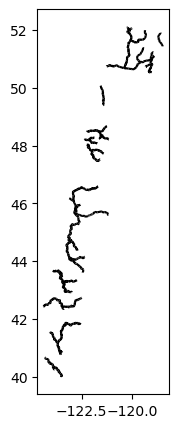

In [7]:
# Simple plot
fig, ax = plt.subplots(figsize=(7,5))
SWOT_HR_shp1.plot(ax=ax, color='black')

In [8]:
# # Another way to plot geopandas dataframes is with `explore`, which also plots a basemap
# SWOT_HR_shp1.explore()

#### **2. Lake Vector Shapefiles**

The lake vector shapefiles can be accessed in the same way as the river shapefiles above. 

For additional tips on spatial searching of SWOT HR L2 data, see also [PO.DAAC Cookbook - SWOT Chapter tips section](https://podaac.github.io/tutorials/quarto_text/SWOT.html#tips-for-swot-hr-spatial-search).

#### Search for data of interest

In [9]:
lake_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_LAKESP_1.1', 
                                       temporal = ('2023-04-08 00:00:00', '2023-04-22 23:59:59'),
                                       granule_name = '*Obs*_013_NA*') # here we filter by files with 'Obs' in the name (This collection has three options: Obs, Unassigned, and Prior), pass #13 and continent code=NA

Granules found: 14


#### Set up an `s3fs` session for Direct Cloud Access
`s3fs` sessions are used for authenticated access to s3 bucket and allows for typical file-system style operations. Below we create session by passing in the data access information.

In [10]:
fs_s3 = earthaccess.get_s3fs_session(results=lake_results)

#### Create Fiona session to work with zip and embedded shapefiles in the AWS Cloud
The native format for this data is a .zip file, and we want the .shp file within the .zip file, so we will create a Fiona AWS session using the credentials from setting up the s3fs session above to access the shapefiles within the zip files. If we don't do this, the alternative would be to download the data to the cloud environment (e.g. EC2 instance, user S3 bucket) and extract the .zip file there.

In [11]:
fiona_session=fiona.session.AWSSession(
        aws_access_key_id=fs_s3.storage_options["key"],
        aws_secret_access_key=fs_s3.storage_options["secret"],
        aws_session_token=fs_s3.storage_options["token"]
    )

In [12]:
# Get the link for the first zip file
lake_link = earthaccess.results.DataGranule.data_links(lake_results[0], access='direct')[0]

# We use the zip+ prefix so fiona knows that we are operating on a zip file
lake_shp_url = f"zip+{lake_link}"

with fiona.Env(session=fiona_session):
    SWOT_HR_shp2 = gpd.read_file(lake_shp_url) 

#view the attribute table
SWOT_HR_shp2

,obs_id,lake_id,overlap,n_overlap,reach_id,time,time_tai,time_str,wse,wse_u,...,load_tidef,load_tideg,pole_tide,dry_trop_c,wet_trop_c,iono_c,xovr_cal_c,lake_name,p_res_id,geometry
0,781229R000006,7810001133,85,1,no_data,7.342536e+08,7.342536e+08,2023-04-08T07:19:21Z,593.993,0.011,...,-0.019138,-0.018407,-0.002311,-2.164411,-0.074947,-0.003339,-1.000000e+12,APPLEGATE RESERVOIR;APPLEGATE LAKE,116,"MULTIPOLYGON (((-123.10728 42.03437, -123.1073..."
1,782232R000018,7820002572;7820002253,86;80,2,no_data,7.342536e+08,7.342536e+08,2023-04-08T07:19:51Z,439.811,0.167,...,-0.016663,-0.016105,-0.002303,-2.199668,-0.069287,-0.003153,-1.000000e+12,HILLS CREEK RESERVOIR,-99999999,"MULTIPOLYGON (((-122.45387 43.68914, -122.4539..."
2,782243R000013,7820039162,10,1,no_data,7.342537e+08,7.342537e+08,2023-04-08T07:21:40Z,341.457,0.003,...,-0.009852,-0.009920,-0.002187,-2.211506,-0.079803,-0.002515,-1.000000e+12,WHITEMAN CREEK;OKANAGAN LAKE;OKANAGAN,-99999999,"MULTIPOLYGON (((-119.72285 49.72639, -119.7227..."
3,782243R015586,7820039162,17,1,no_data,7.342537e+08,7.342537e+08,2023-04-08T07:21:48Z,341.513,0.028,...,-0.009454,-0.009599,-0.002172,-2.209661,-0.079193,-0.002491,-1.000000e+12,WHITEMAN CREEK;OKANAGAN LAKE;OKANAGAN,-99999999,"MULTIPOLYGON (((-119.49606 50.06182, -119.4961..."
4,783245R000005,7830263943,32,1,78322700063;78322700091;78322800011;7832290001...,7.342537e+08,7.342537e+08,2023-04-08T07:22:01Z,344.832,0.014,...,-0.009029,-0.009206,-0.002157,-2.207273,-0.082830,-0.002465,-1.000000e+12,ROSS CREEK;EAGLE RIVER;SHUSWAP;LITTLE RIVER;SC...,-99999999,"MULTIPOLYGON (((-119.35814 50.94441, -119.3580..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
831,783246R009013,7830249372;7830249352,81;71,2,no_data,7.342537e+08,7.342538e+08,2023-04-08T07:22:13Z,1837.232,0.563,...,-0.008546,-0.008791,-0.002133,-2.094712,-0.066065,-0.002440,-1.000000e+12,no_data,-99999999,"MULTIPOLYGON (((-118.98292 51.59811, -118.9830..."
832,783246R009931,7830249332,87,1,no_data,7.342537e+08,7.342538e+08,2023-04-08T07:22:14Z,1635.514,0.325,...,-0.008539,-0.008785,-0.002132,-2.136184,-0.071612,-0.002440,-1.000000e+12,no_data,-99999999,"POLYGON ((-118.98463 51.61215, -118.98453 51.6..."
833,783246R010740,7830243082,82,1,no_data,7.342537e+08,7.342538e+08,2023-04-08T07:22:14Z,2094.295,5.792,...,-0.008558,-0.008815,-0.002135,-1.942940,-0.048756,-0.002438,-1.000000e+12,no_data,-99999999,"MULTIPOLYGON (((-119.07615 51.67504, -119.0759..."
834,783246R010910,7830256902,21,1,no_data,7.342537e+08,7.342538e+08,2023-04-08T07:22:14Z,1996.670,0.303,...,-0.008524,-0.008775,-0.002132,-1.863152,-0.041920,-0.002443,-1.000000e+12,no_data,-99999999,"POLYGON ((-118.97489 51.63692, -118.97478 51.6..."


#### Quickly plot the SWOT lakes data

<Axes: >

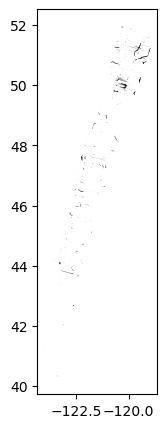

In [13]:
fig, ax = plt.subplots(figsize=(7,5))
SWOT_HR_shp2.plot(ax=ax, color='black')

**Accessing the remaining files is different than the shp files above.** We do not need to read the shapefiles within a zip file using something like Fiona session (or to download and unzip in the cloud) because the following SWOT HR collections are stored in **netCDF** files in the cloud. For the rest of the products, we will open via `xarray`, not `geopandas`.

#### **3. Water Mask Pixel Cloud NetCDF**

#### Search for data collection and time of interest

For additional tips on spatial searching of SWOT HR L2 data, see also [PO.DAAC Cookbook - SWOT Chapter tips section](https://podaac.github.io/tutorials/quarto_text/SWOT.html#tips-for-swot-hr-spatial-search).

In [14]:
pixc_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_PIXC_1.1',
                                       temporal = ('2023-04-22 00:00:00', '2023-04-22 23:59:59'), 
                                       granule_name = '*_498_013_*') # here we filter by cycle=498 and pass=013                                       

Granules found: 164


#### Set up an `s3fs` session for Direct Cloud Access
`s3fs` sessions are used for authenticated access to s3 bucket and allows for typical file-system style operations. Below we create session by passing in the data access information.

In [15]:
fs_s3 = earthaccess.get_s3fs_session(results=pixc_results)

# get link for file 100
pixc_link = earthaccess.results.DataGranule.data_links(pixc_results[100], access='direct')[0]

s3_file_obj3 = fs_s3.open(pixc_link, mode='rb')

#### Open data using xarray

The pixel cloud netCDF files are formatted with three groups titled, "pixel cloud", "tvp", or "noise" (more detail [here](https://podaac-tools.jpl.nasa.gov/drive/files/misc/web/misc/swot_mission_docs/pdd/D-56411_SWOT_Product_Description_L2_HR_PIXC_20200810.pdf)). In order to access the coordinates and variables within the file, a group must be specified when calling xarray open_dataset.

In [16]:
ds_PIXC = xr.open_dataset(s3_file_obj3, group = 'pixel_cloud', engine='h5netcdf')
ds_PIXC

<xarray.Dataset>
Dimensions:                                (points: 5180594, complex_depth: 2,
                                            num_pixc_lines: 3239)
Coordinates:
    latitude                               (points) float64 ...
    longitude                              (points) float64 ...
Dimensions without coordinates: points, complex_depth, num_pixc_lines
Data variables: (12/57)
    azimuth_index                          (points) float64 ...
    range_index                            (points) float64 ...
    interferogram                          (points, complex_depth) float32 ...
    power_plus_y                           (points) float32 ...
    power_minus_y                          (points) float32 ...
    coherent_power                         (points) float32 ...
    ...                                     ...
    interferogram_qual                     (points) float64 ...
    classification_qual                    (points) float64 ...
    geolocation_qual                       (points) float64 ...
    sig0_qual                              (points) float64 ...
    pixc_line_qual                         (num_pixc_lines) float64 ...
    pixc_line_to_tvp                       (num_pixc_lines) float32 ...
Attributes:
    description:                 cloud of geolocated interferogram pixels
    interferogram_size_azimuth:  3239
    interferogram_size_range:    5526
    looks_to_efflooks:           1.5309342049156023
    num_azimuth_looks:           7.0
    azimuth_offset:              3

#### Simple plot of the results

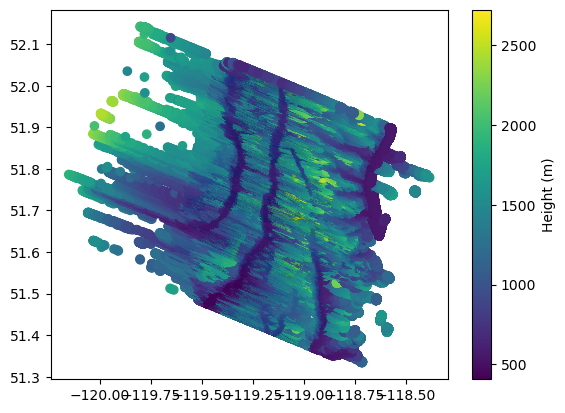

In [17]:
# This could take a few minutes to plot
plt.scatter(x=ds_PIXC.longitude, y=ds_PIXC.latitude, c=ds_PIXC.height)
plt.colorbar().set_label('Height (m)')

#### **4. Water Mask Pixel Cloud Vector Attribute NetCDF**

#### Search for data of interest

In [24]:
pixcvec_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_PIXCVEC_1.1', 
                                          temporal = ('2023-04-08 00:00:00', '2023-04-22 23:59:59'), 
                                          granule_name = '*_498_013_*') # here we filter by cycle=498 and pass=013 

Granules found: 100


#### Set up an `s3fs` session for Direct Cloud Access
`s3fs` sessions are used for authenticated access to s3 bucket and allows for typical file-system style operations. Below we create session by passing in the data access information.

In [25]:
fs_s3 = earthaccess.get_s3fs_session(results=pixcvec_results)

# get link for file 0
pixcvec_link = earthaccess.results.DataGranule.data_links(pixcvec_results[0], access='direct')[0]

s3_file_obj4 = fs_s3.open(pixcvec_link, mode='rb')

#### Open data using xarray

In [26]:
ds_PIXCVEC = xr.open_dataset(s3_file_obj4, decode_cf=False,  engine='h5netcdf')
ds_PIXCVEC

<xarray.Dataset>
Dimensions:               (points: 11174047, nchar_reach_id: 11,
                           nchar_node_id: 14, nchar_lake_id: 10,
                           nchar_obs_id: 13)
Dimensions without coordinates: points, nchar_reach_id, nchar_node_id,
                                nchar_lake_id, nchar_obs_id
Data variables:
    azimuth_index         (points) int32 ...
    range_index           (points) int32 ...
    latitude_vectorproc   (points) float64 ...
    longitude_vectorproc  (points) float64 ...
    height_vectorproc     (points) float32 ...
    reach_id              (points, nchar_reach_id) |S1 ...
    node_id               (points, nchar_node_id) |S1 ...
    lake_id               (points, nchar_lake_id) |S1 ...
    obs_id                (points, nchar_obs_id) |S1 ...
    ice_clim_f            (points) int8 ...
    ice_dyn_f             (points) int8 ...
Attributes: (12/45)
    Conventions:                     CF-1.7
    title:                           Level 2 KaRIn high rate pixel cloud vect...
    short_name:                      L2_HR_PIXCVec
    institution:                     JPL
    source:                          Level 1B KaRIn High Rate Single Look Com...
    history:                         2023-09-07T04:43:11.652934Z: Creation
    ...                              ...
    xref_prior_river_db_file:        
    xref_prior_lake_db_file:         SWOT_LakeDatabase_Cal_013_20000101T00000...
    xref_reforbittrack_files:        SWOT_RefOrbitTrackTileBoundary_Cal_20000...
    xref_param_l2_hr_laketile_file:  SWOT_Param_L2_HR_LakeTile_20000101T00000...
    ellipsoid_semi_major_axis:       6378137.0
    ellipsoid_flattening:            0.0033528106647474805

#### Simple plot

In [27]:
pixcvec_htvals = ds_PIXCVEC.height_vectorproc.compute()
pixcvec_latvals = ds_PIXCVEC.latitude_vectorproc.compute()
pixcvec_lonvals = ds_PIXCVEC.longitude_vectorproc.compute()

#Before plotting, we set all fill values to nan so that the graph shows up better spatially
pixcvec_htvals[pixcvec_htvals > 15000] = np.nan
pixcvec_latvals[pixcvec_latvals > 80] = np.nan
pixcvec_latvals[pixcvec_latvals < -80] = np.nan
pixcvec_lonvals[pixcvec_lonvals > 180] = np.nan
pixcvec_lonvals[pixcvec_lonvals < -180] = np.nan

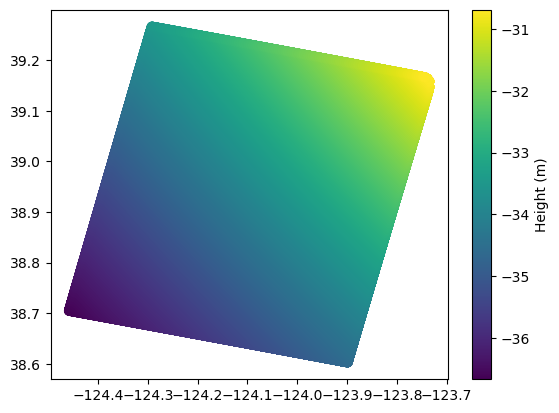

In [28]:
plt.scatter(x=pixcvec_lonvals, y=pixcvec_latvals, c=pixcvec_htvals)
plt.colorbar().set_label('Height (m)')

#### **5. Raster NetCDF**

#### Search for data of interest

For additional tips on spatial searching of SWOT HR L2 data, see also [PO.DAAC Cookbook - SWOT Chapter tips section](https://podaac.github.io/tutorials/quarto_text/SWOT.html#tips-for-swot-hr-spatial-search).

In [36]:
#Say we know the exact cycle, pass & scene. We can search for one data granule!
raster_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_Raster_1.1', 
                                         temporal = ('2023-04-01 00:00:00', '2023-04-22 23:59:59'), 
                                         granule_name = '*100m*_498_013_130F*') # here we filter by files with '100m' in the name (This collection has two resolution options: 100m & 250m), cycle=498, pass=013, scene = 130F 

Granules found: 1


#### Set up an `s3fs` session for Direct Cloud Access
`s3fs` sessions are used for authenticated access to s3 bucket and allows for typical file-system style operations. Below we create session by passing in the data access information.

In [37]:
fs_s3 = earthaccess.get_s3fs_session(results=raster_results)

# get link for file 
raster_link = earthaccess.results.DataGranule.data_links(raster_results[0], access='direct')[0]

s3_file_obj5 = fs_s3.open(raster_link, mode='rb')

#### Open data with xarray

In [38]:
ds_raster = xr.open_dataset(s3_file_obj5, engine='h5netcdf')
ds_raster

/srv/conda/envs/notebook/lib/python3.10/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/srv/conda/envs/notebook/lib/python3.10/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


<xarray.Dataset>
Dimensions:                  (x: 1652, y: 1651)
Coordinates:
  * x                        (x) float64 5.438e+05 5.439e+05 ... 7.089e+05
  * y                        (y) float64 6.468e+06 6.468e+06 ... 6.633e+06
Data variables: (12/39)
    crs                      object ...
    longitude                (y, x) float64 ...
    latitude                 (y, x) float64 ...
    wse                      (y, x) float32 ...
    wse_qual                 (y, x) float32 ...
    wse_qual_bitwise         (y, x) float64 ...
    ...                       ...
    load_tide_fes            (y, x) float32 ...
    load_tide_got            (y, x) float32 ...
    pole_tide                (y, x) float32 ...
    model_dry_tropo_cor      (y, x) float32 ...
    model_wet_tropo_cor      (y, x) float32 ...
    iono_cor_gim_ka          (y, x) float32 ...
Attributes: (12/49)
    Conventions:                   CF-1.7
    title:                         Level 2 KaRIn High Rate Raster Data Product
    source:                        Ka-band radar interferometer
    history:                       2023-09-13T20:22:58Z : Creation
    platform:                      SWOT
    reference_document:            JPL D-56416 - Revision B - October 24, 2022
    ...                            ...
    x_max:                         708900.0
    y_min:                         6467900.0
    y_max:                         6632900.0
    institution:                   JPL
    references:                    V1.0
    product_version:               01

#### Quick interactive plot with `hvplot`

In [39]:
ds_raster.wse.hvplot.image(y='y', x='x')

:Image   [x,y]   (wse)

#### **6. SLC** 

#### Search for data collection and time of interest

For additional tips on spatial searching of SWOT HR L2 data, see also [PO.DAAC Cookbook - SWOT Chapter tips section](https://podaac.github.io/tutorials/quarto_text/SWOT.html#tips-for-swot-hr-spatial-search).

In [40]:
slc_results = earthaccess.search_data(short_name = 'SWOT_L1B_HR_SLC_1.1',
                                       temporal = ('2023-04-22 00:00:00', '2023-04-22 23:59:59'), 
                                       granule_name = '*_498_013_*') # here we filter by cycle=498 and pass=013 with wildcards

Granules found: 164


#### Set up an `s3fs` session for Direct Cloud Access
`s3fs` sessions are used for authenticated access to s3 bucket and allows for typical file-system style operations. Below we create session by passing in the data access information.

In [41]:
fs_s3 = earthaccess.get_s3fs_session(results=slc_results)

# get link for file 
slc_link = earthaccess.results.DataGranule.data_links(slc_results[0], access='direct')[0]

s3_file_obj6 = fs_s3.open(slc_link, mode='rb')

#### Open data using xarray
The L1B_HR_SLC product file contains five NetCDF data group called the slc, xfactor, noise, tvp, and grdem groups. More info can be found in the [product description document within the dataset table](https://podaac.jpl.nasa.gov/SWOT?tab=datasets) for each group.

In [42]:
ds_SLC = xr.open_dataset(s3_file_obj6, group = 'slc', engine='h5netcdf')
ds_SLC

<xarray.Dataset>
Dimensions:      (num_lines: 17954, num_pixels: 4630, complex_depth: 2)
Dimensions without coordinates: num_lines, num_pixels, complex_depth
Data variables:
    slc_plus_y   (num_lines, num_pixels, complex_depth) float32 ...
    slc_minus_y  (num_lines, num_pixels, complex_depth) float32 ...
    slc_qual     (num_lines) float32 ...
Attributes:
    description:  Single look complex images for plus_y and minus_y channels